이 ipynb 파일은 적용하는 augmentation을 시각화해주는 파일입니다.<br>
이 파일에서 사용자가 직접 입력해줘야 되는 부분은<br>
**'0) 시각화 전, 경로정보와 사용하는 augmentaitaon, dataset class 명시해주기 '**<br>
입니다.

In [1]:
import os
import random
import json
import warnings 
warnings.filterwarnings('ignore')

import torch

import numpy as np
import pandas as pd
from pycocotools.coco import COCO

import albumentations as A
from albumentations.pytorch import ToTensorV2
from albumentations.augmentations.transforms import *

import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import webcolors
import cv2

from importlib import import_module
import copy

from augmentation import *
from dataset import *


%matplotlib inline
plt.rcParams['axes.grid'] = False

### 0) 시각화 전, 경로정보와 사용하는 augmentaitaon, dataset class 명시해주기 

In [2]:
dataset_path  = '/opt/ml/segmentation/input/data'
train_path = "/opt/ml/segmentation/semantic-segmentation-level2-cv-13/splited_json/train_split_0.json"
batch_size = 16

# 1. 사용하는 augmentation class 정의
train_transform_module = BatteryClothingMetalPPCopyPasteAugmentation()
train_transform = train_transform_module.transform
# 2. 사용하는 dataset class 정의
train_dataset = CustomDataset2(data_root='../input/data', json_dir=train_path, transform=train_transform) 

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=0.04s)
creating index...
index created!
loading annotations into memory...
Done (t=0.03s)
creating index...
index created!
loading annotations into memory...
Done (t=2.61s)
creating index...
index created!


### 1) 데이터로더 정의

In [3]:
def collate_fn(batch):
    return tuple(zip(*batch))

# DataLoader
train_loader = torch.utils.data.DataLoader(dataset=train_dataset, 
                                           batch_size=batch_size,
                                           shuffle=True,
                                           num_workers=4,
                                           collate_fn=collate_fn)

### 2) 데이터 시각화를 위한 함수 정의

In [5]:
class_colormap = pd.read_csv("/opt/ml/segmentation/baseline_code/class_dict.csv")

def inverse_normalize(tensor, mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)):
    tensor_copy = copy.deepcopy(tensor)
    for t, m, s in zip(tensor_copy, mean, std):
        t.mul_(s).add_(m)
    return tensor_copy

def create_trash_label_colormap():
    """Creates a label colormap used in Trash segmentation.
    Returns:
        A colormap for visualizing segmentation results.
    """
    colormap = np.zeros((11, 3), dtype=np.uint8)
    for inex, (_, r, g, b) in enumerate(class_colormap.values):
        colormap[inex] = [r, g, b]
    
    return colormap

def label_to_color_image(label):
    """Adds color defined by the dataset colormap to the label.

    Args:
        label: A 2D array with integer type, storing the segmentation label.

    Returns:
        result: A 2D array with floating type. The element of the array
                is the color indexed by the corresponding element in the input label
                to the trash color map.

    Raises:
        ValueError: If label is not of rank 2 or its value is larger than color
              map maximum entry.
    """
    if label.ndim != 2:
        raise ValueError('Expect 2-D input label')

    colormap = create_trash_label_colormap()

    if np.max(label) >= len(colormap):
        raise ValueError('label value too large.')

    return colormap[label]

# variable for legend
category_and_rgb = [[category, (r,g,b)] for _, (category, r, g, b) in enumerate(class_colormap.values)]
legend_elements = [Patch(facecolor=webcolors.rgb_to_hex(rgb), 
                            edgecolor=webcolors.rgb_to_hex(rgb), 
                            label=category) for category, rgb in category_and_rgb]

### 3) augmentation된 데이터 시각화

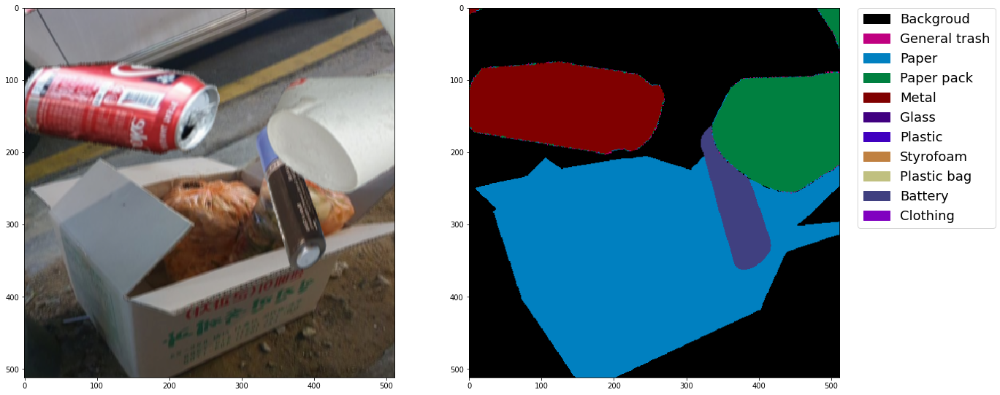

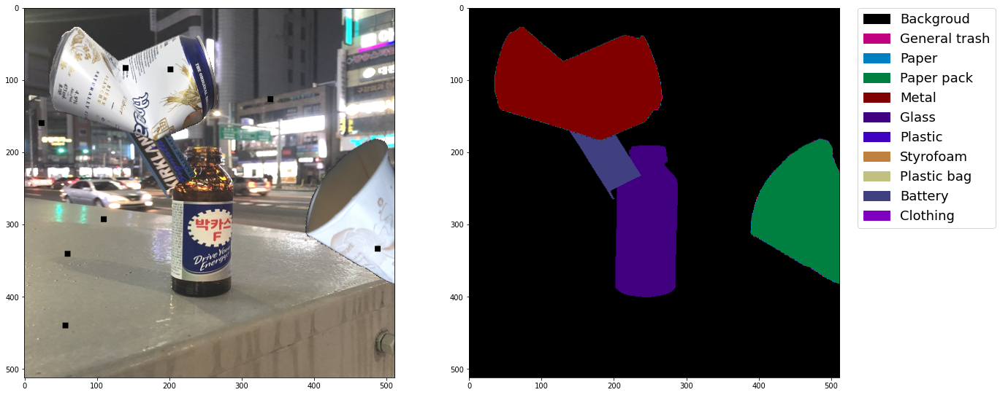

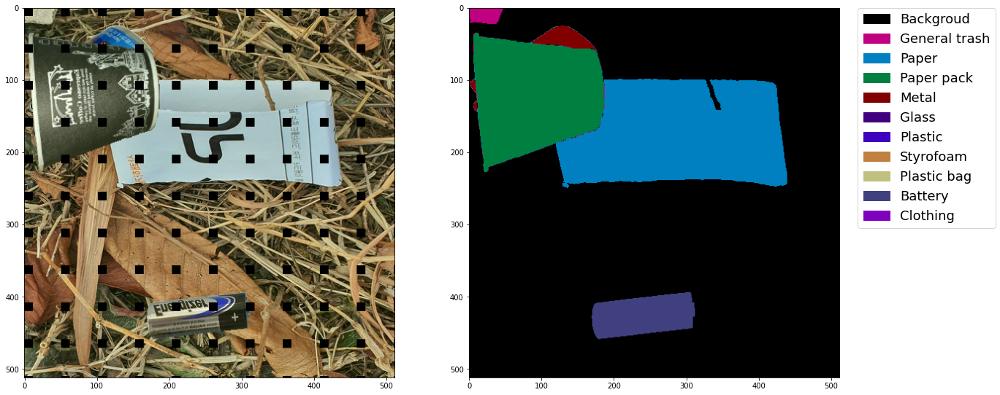

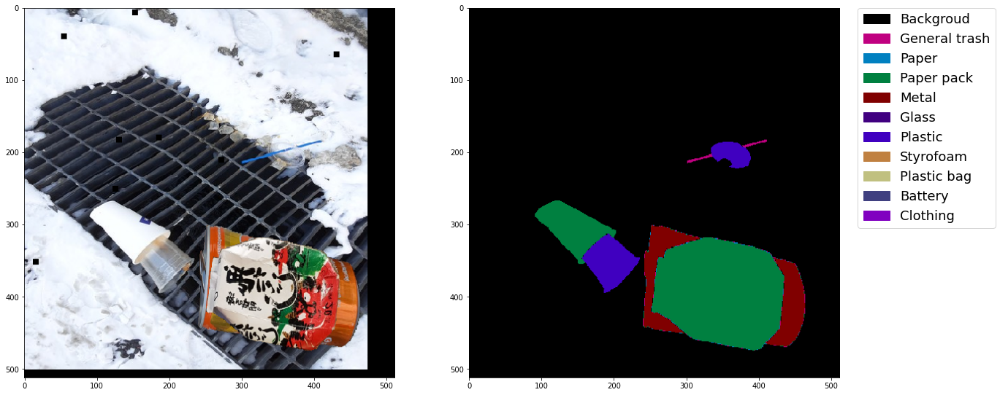

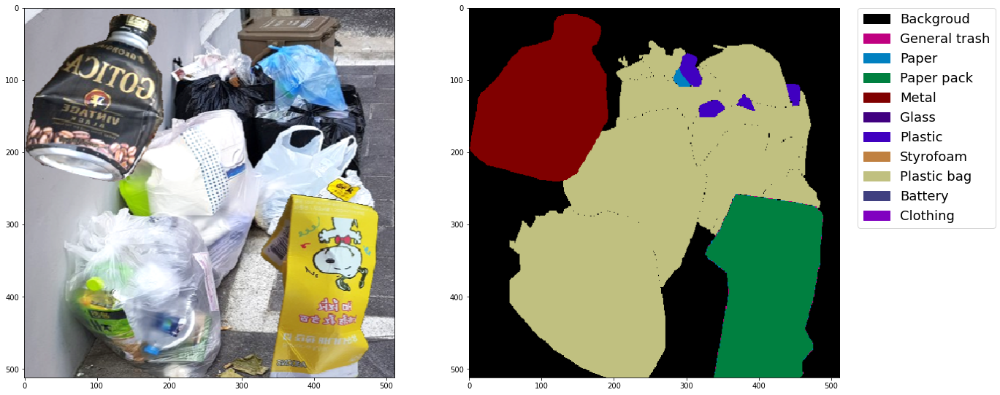

...

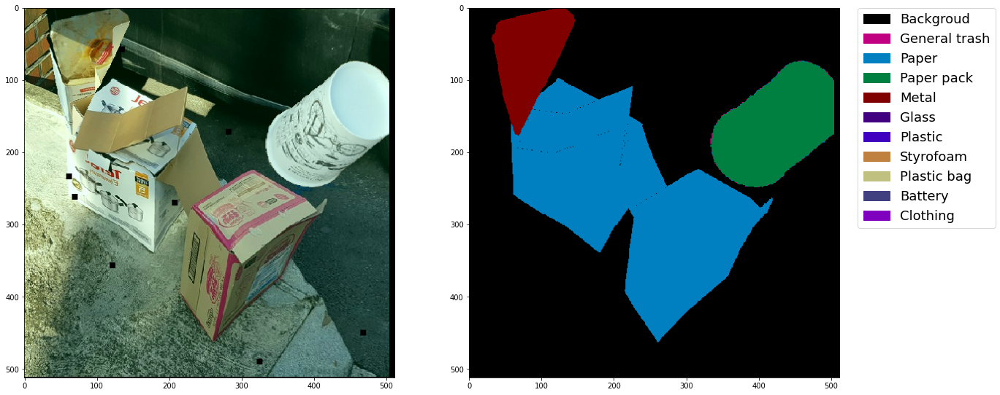

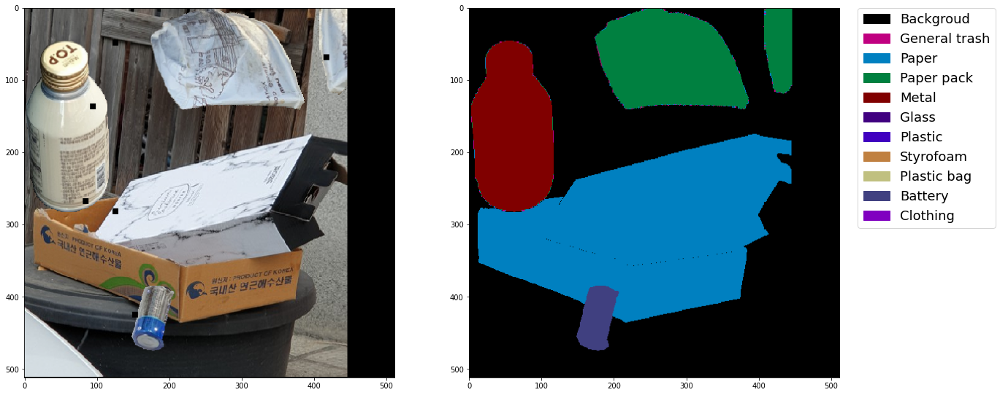

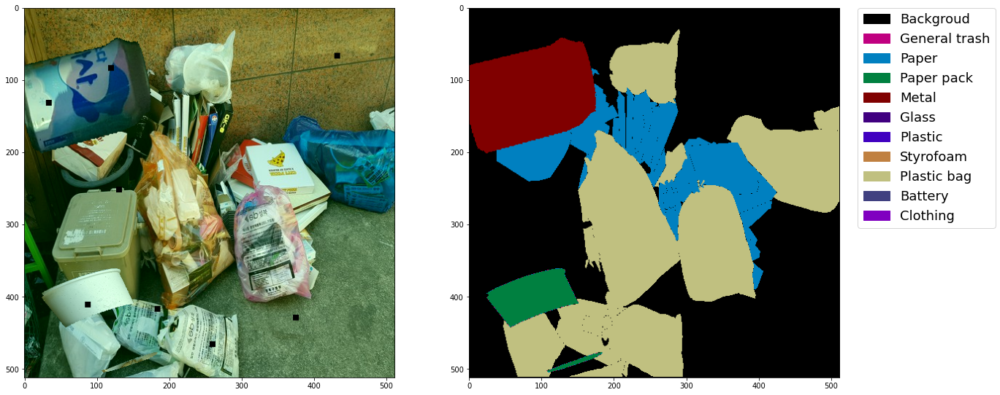

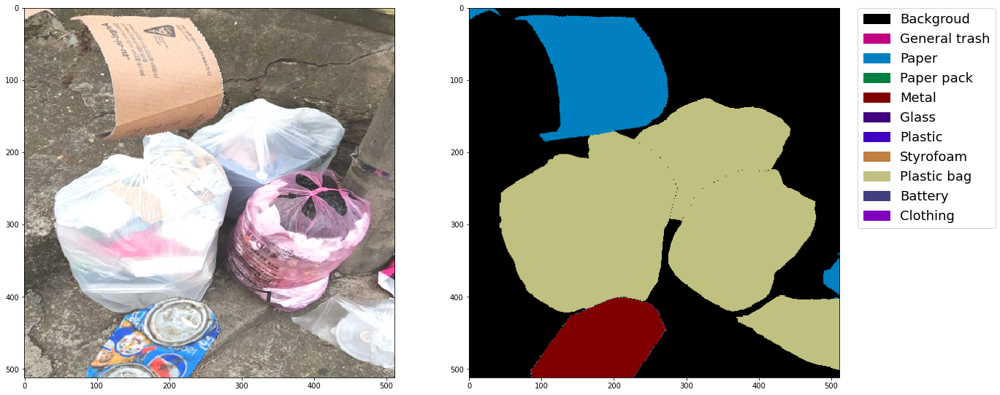

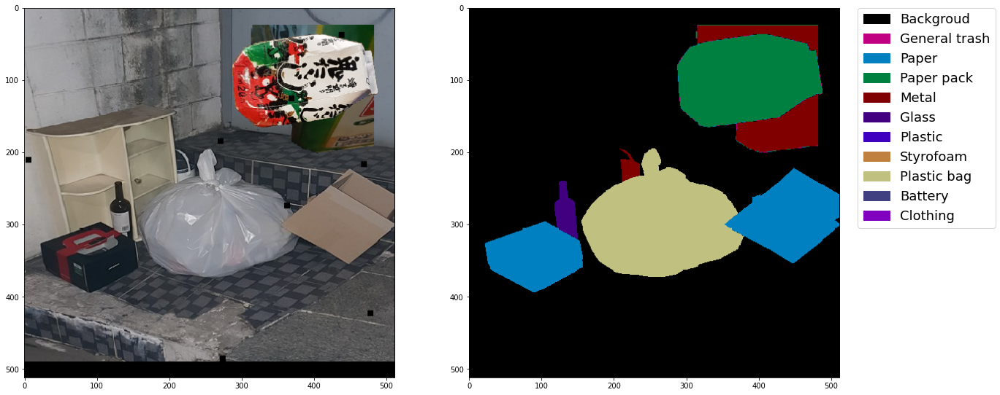

In [6]:
images, masks = next(iter(train_loader))

for idx in range(batch_size):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 20))
    ax1.imshow(inverse_normalize(images[idx]).permute([1,2,0]))
    ax2.imshow(label_to_color_image(masks[idx].detach().cpu().numpy()))
    ax2.legend(handles=legend_elements, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0, prop={'size': 18})

    plt.show()